In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df=pd.read_csv('PUBG.csv')
df

,player_name,tracker_id,solo_KillDeathRatio,solo_WinRatio,solo_TimeSurvived,solo_RoundsPlayed,solo_Wins,solo_WinTop10Ratio,solo_Top10s,solo_Top10Ratio,...,squad_RideDistance,squad_MoveDistance,squad_AvgWalkDistance,squad_AvgRideDistance,squad_LongestKill,squad_Heals,squad_Revives,squad_Boosts,squad_DamageDealt,squad_DBNOs
0,BreakNeck,4405,3.14,17.65,18469.14,17,3,0.83,4,23.5,...,3751590.99,5194786.58,2626.97,4372.64,536.98,2186,234,1884,242132.73,1448
1,Blackwalk,8199,4.41,18.18,33014.86,33,6,0.36,11,33.3,...,4295917.30,6051783.67,2422.48,6009.73,734.85,2041,276,2340,269795.75,1724
2,mercedes_benz,4454,3.60,0.00,4330.44,5,0,0.00,1,20.0,...,3935265.63,5589608.74,1871.89,3011.87,725.44,1766,210,2193,292977.07,1897
3,DORA,7729,14.00,50.00,13421.82,8,4,0.67,6,75.0,...,2738998.00,3796916.00,2154.62,5578.41,587.28,1214,142,1252,181106.90,1057
4,n2tstar,0,10.50,33.33,9841.04,6,2,0.40,5,83.3,...,2347295.00,3220260.00,2098.47,5642.54,546.10,1245,120,923,160029.80,1077
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87893,SaikoMene,87710,1.05,0.00,48273.92,62,0,0.00,5,8.1,...,105321.37,211421.17,1863.11,1503.24,489.84,136,15,70,7285.37,41
87894,KARUKOR,22783,1.61,4.65,49006.75,43,2,0.22,9,20.9,...,98108.14,242154.75,1636.41,1590.67,235.24,143,26,72,14440.64,97
87895,Dertydann,178547,1.00,0.00,14272.20,16,0,0.00,1,6.2,...,177062.72,384254.27,2109.40,1088.12,453.87,157,24,95,15939.11,92
87896,Neferhor,126589,5.10,16.67,58518.86,48,8,0.44,18,37.5,...,523052.83,853232.16,1785.15,1804.51,449.91,397,39,317,56870.07,350


In [4]:
df.info(all)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87898 entries, 0 to 87897
Data columns (total 152 columns):
 #   Column                     Dtype  
---  ------                     -----  
 0   player_name                object 
 1   tracker_id                 int64  
 2   solo_KillDeathRatio        float64
 3   solo_WinRatio              float64
 4   solo_TimeSurvived          float64
 5   solo_RoundsPlayed          int64  
 6   solo_Wins                  int64  
 7   solo_WinTop10Ratio         float64
 8   solo_Top10s                int64  
 9   solo_Top10Ratio            float64
 10  solo_Losses                int64  
 11  solo_Rating                float64
 12  solo_BestRating            float64
 13  solo_DamagePg              float64
 14  solo_HeadshotKillsPg       float64
 15  solo_HealsPg               float64
 16  solo_KillsPg               float64
 17  solo_MoveDistancePg        float64
 18  solo_RevivesPg             int64  
 19  solo_RoadKillsPg           float64
 20  solo_

Нам нужны только игровые данные,которые генерируются в процессе игры.Имя и трекер используются для идентификации.

In [5]:
df=df.drop('player_name',axis=1)
df=df.drop('tracker_id',axis=1)
df

,solo_KillDeathRatio,solo_WinRatio,solo_TimeSurvived,solo_RoundsPlayed,solo_Wins,solo_WinTop10Ratio,solo_Top10s,solo_Top10Ratio,solo_Losses,solo_Rating,...,squad_RideDistance,squad_MoveDistance,squad_AvgWalkDistance,squad_AvgRideDistance,squad_LongestKill,squad_Heals,squad_Revives,squad_Boosts,squad_DamageDealt,squad_DBNOs
0,3.14,17.65,18469.14,17,3,0.83,4,23.5,14,1559.78,...,3751590.99,5194786.58,2626.97,4372.64,536.98,2186,234,1884,242132.73,1448
1,4.41,18.18,33014.86,33,6,0.36,11,33.3,27,1884.53,...,4295917.30,6051783.67,2422.48,6009.73,734.85,2041,276,2340,269795.75,1724
2,3.60,0.00,4330.44,5,0,0.00,1,20.0,5,1255.92,...,3935265.63,5589608.74,1871.89,3011.87,725.44,1766,210,2193,292977.07,1897
3,14.00,50.00,13421.82,8,4,0.67,6,75.0,4,1798.70,...,2738998.00,3796916.00,2154.62,5578.41,587.28,1214,142,1252,181106.90,1057
4,10.50,33.33,9841.04,6,2,0.40,5,83.3,4,1668.67,...,2347295.00,3220260.00,2098.47,5642.54,546.10,1245,120,923,160029.80,1077
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87893,1.05,0.00,48273.92,62,0,0.00,5,8.1,62,1353.23,...,105321.37,211421.17,1863.11,1503.24,489.84,136,15,70,7285.37,41
87894,1.61,4.65,49006.75,43,2,0.22,9,20.9,41,1969.95,...,98108.14,242154.75,1636.41,1590.67,235.24,143,26,72,14440.64,97
87895,1.00,0.00,14272.20,16,0,0.00,1,6.2,16,1329.05,...,177062.72,384254.27,2109.40,1088.12,453.87,157,24,95,15939.11,92
87896,5.10,16.67,58518.86,48,8,0.44,18,37.5,40,1926.92,...,523052.83,853232.16,1785.15,1804.51,449.91,397,39,317,56870.07,350


In [6]:
from sklearn.preprocessing import StandardScaler

In [7]:
standard_df = StandardScaler().fit_transform(df)
standard_df.shape

(87898, 150)

In [8]:
from sklearn import decomposition

In [9]:
pca=decomposition.PCA()
pca.n_components=150
pca_df=pca.fit_transform(standard_df)
df=pd.DataFrame(pca_df)
df

,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
0,22.210751,-24.452080,-8.719662,-20.109519,-1.876100,7.057180,-5.461475,2.340398,-3.712734,2.356364,...,-8.183741e-15,-1.373558e-15,-7.999659e-16,-2.566835e-15,-1.222298e-15,-1.562899e-15,5.338682e-16,-3.330378e-16,1.100909e-15,8.849341e-16
1,26.268555,-24.723411,-10.028069,-22.731967,-1.213700,4.967961,-7.384520,4.652303,-3.142885,0.872144,...,-3.126012e-15,-1.977842e-15,1.995649e-16,6.679646e-16,1.209359e-16,-6.220827e-16,-1.204506e-15,-1.297695e-15,-4.947799e-16,3.469264e-16
2,24.495184,-26.362005,-12.851975,-21.117107,0.815438,9.040906,-3.976439,3.105767,-1.613742,3.563882,...,-2.166615e-16,-7.312847e-17,2.170245e-15,-1.166795e-15,1.145339e-15,2.110307e-15,2.591870e-15,2.306373e-16,3.749092e-15,4.794643e-18
3,14.638549,-24.182296,0.668058,-16.495351,-2.405830,0.058071,-2.633563,2.491476,-2.424127,3.090552,...,1.318788e-15,9.286641e-17,1.462402e-15,2.172266e-15,2.711329e-15,4.438541e-16,9.415517e-16,-2.938629e-16,-2.173988e-15,-5.778357e-16
4,19.299245,-21.193751,1.986358,-6.858745,-3.532773,0.491709,-5.072177,1.551694,-3.229771,3.366990,...,4.144811e-16,7.237706e-16,2.916396e-15,2.947891e-15,3.464438e-15,3.037994e-16,4.551539e-16,-4.190775e-16,-1.937183e-15,-3.815078e-16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87893,-6.204643,1.226857,0.083703,-0.648309,0.476300,1.239524,-0.571700,1.728662,0.843716,-0.662500,...,7.375784e-17,-2.268124e-17,2.359352e-16,-1.356265e-16,-4.242088e-18,-7.339314e-17,1.901304e-16,2.784983e-17,-4.509899e-17,1.962665e-19
87894,-4.113659,-0.818243,1.122798,-1.001329,0.847734,-0.298658,0.676954,-0.186081,0.227348,-2.025564,...,1.619335e-17,-3.829239e-17,1.118073e-16,-3.181345e-17,8.880629e-18,-2.590739e-17,5.288239e-17,2.597288e-18,-2.298529e-17,-1.817249e-18
87895,-3.870044,0.339319,-2.643951,2.693404,0.204088,1.022159,0.487850,0.604478,1.738769,0.116964,...,1.733604e-16,5.043978e-17,7.953726e-18,5.421450e-18,1.914698e-17,1.032003e-18,2.157354e-17,3.267264e-18,-1.426203e-18,-5.815393e-18
87896,16.932602,-4.010364,6.841286,6.896524,-1.267066,1.746987,0.584138,0.105874,2.122303,0.694025,...,-1.609697e-16,2.119593e-16,-2.767676e-16,9.962625e-17,-7.506218e-17,1.110310e-16,-1.260422e-16,-8.282852e-18,-1.081968e-16,-1.403365e-17


In [10]:
from sklearn.cluster import KMeans

1 calculated
2 calculated
3 calculated
4 calculated
5 calculated
6 calculated
7 calculated
8 calculated
9 calculated
10 calculated
11 calculated
12 calculated
13 calculated
14 calculated


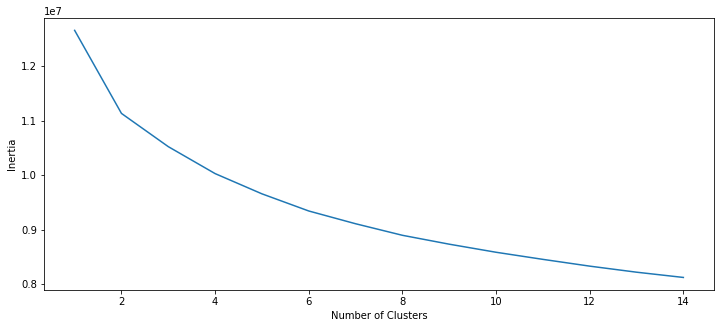

In [11]:
clusters=range(1,15)
inertias=[]
for i in clusters:
    kmean=KMeans(n_clusters=i,init='k-means++',random_state=1)
    kmean.fit(df)
    inertias.append(kmean.inertia_)
    print(f'{i} calculated')
    
plt.figure(figsize=(12,5))
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.plot(clusters,inertias);

In [12]:
kmeans=KMeans(n_clusters=5,init='k-means++',random_state=1).fit(df)
labels=kmeans.labels_
print(labels)
print(max(labels))
print(min(labels))

[3 3 3 ... 4 3 4]
4
0


In [13]:
df['Cluster']=pd.Series(labels)
cluster_names={0:'Claster 0',
              1:'Claster 1',
              2:'Claster 2',
              3:'Claster 3',
              4:'Claster 4'}
df['Cluster_names']=df['Cluster'].map(cluster_names)

In [14]:
df

,0,1,2,3,4,5,6,7,8,9,...,142,143,144,145,146,147,148,149,Cluster,Cluster_names
0,22.210751,-24.452080,-8.719662,-20.109519,-1.876100,7.057180,-5.461475,2.340398,-3.712734,2.356364,...,-7.999659e-16,-2.566835e-15,-1.222298e-15,-1.562899e-15,5.338682e-16,-3.330378e-16,1.100909e-15,8.849341e-16,3,Claster 3
1,26.268555,-24.723411,-10.028069,-22.731967,-1.213700,4.967961,-7.384520,4.652303,-3.142885,0.872144,...,1.995649e-16,6.679646e-16,1.209359e-16,-6.220827e-16,-1.204506e-15,-1.297695e-15,-4.947799e-16,3.469264e-16,3,Claster 3
2,24.495184,-26.362005,-12.851975,-21.117107,0.815438,9.040906,-3.976439,3.105767,-1.613742,3.563882,...,2.170245e-15,-1.166795e-15,1.145339e-15,2.110307e-15,2.591870e-15,2.306373e-16,3.749092e-15,4.794643e-18,3,Claster 3
3,14.638549,-24.182296,0.668058,-16.495351,-2.405830,0.058071,-2.633563,2.491476,-2.424127,3.090552,...,1.462402e-15,2.172266e-15,2.711329e-15,4.438541e-16,9.415517e-16,-2.938629e-16,-2.173988e-15,-5.778357e-16,3,Claster 3
4,19.299245,-21.193751,1.986358,-6.858745,-3.532773,0.491709,-5.072177,1.551694,-3.229771,3.366990,...,2.916396e-15,2.947891e-15,3.464438e-15,3.037994e-16,4.551539e-16,-4.190775e-16,-1.937183e-15,-3.815078e-16,3,Claster 3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87893,-6.204643,1.226857,0.083703,-0.648309,0.476300,1.239524,-0.571700,1.728662,0.843716,-0.662500,...,2.359352e-16,-1.356265e-16,-4.242088e-18,-7.339314e-17,1.901304e-16,2.784983e-17,-4.509899e-17,1.962665e-19,4,Claster 4
87894,-4.113659,-0.818243,1.122798,-1.001329,0.847734,-0.298658,0.676954,-0.186081,0.227348,-2.025564,...,1.118073e-16,-3.181345e-17,8.880629e-18,-2.590739e-17,5.288239e-17,2.597288e-18,-2.298529e-17,-1.817249e-18,4,Claster 4
87895,-3.870044,0.339319,-2.643951,2.693404,0.204088,1.022159,0.487850,0.604478,1.738769,0.116964,...,7.953726e-18,5.421450e-18,1.914698e-17,1.032003e-18,2.157354e-17,3.267264e-18,-1.426203e-18,-5.815393e-18,4,Claster 4
87896,16.932602,-4.010364,6.841286,6.896524,-1.267066,1.746987,0.584138,0.105874,2.122303,0.694025,...,-2.767676e-16,9.962625e-17,-7.506218e-17,1.110310e-16,-1.260422e-16,-8.282852e-18,-1.081968e-16,-1.403365e-17,3,Claster 3


In [15]:
#sudo /home/ippolit/anaconda3/bin/conda install -c https://conda.anaconda.org/plotly plotly
import plotly.express as px

In [16]:
%matplotlib inline 
scatter=px.scatter_3d(x=0,y=1,z=2,data_frame=df,color=df['Cluster_names'])
scatter.show()